# READ CSV

In [3]:
import pandas as pd
csv = pd.read_csv('./interaction.csv')


# clear data

In [4]:
twitter_interaction = csv.drop(columns=["_index","_type","_id","_score","_source.id","_source.source"])
twitter_interaction = twitter_interaction.rename(columns={"_source.twittos_a":"twittos_a","_source.interaction":"interaction","_source.twittos_b":"twittos_b"}) 
twitter_interaction

,twittos_a,interaction,twittos_b
0,500989115,retweet,744306004582612992
1,500989115,converse,1213783872099373057
2,1238416716817936386,follow,500989115
3,1235282853409280000,follow,500989115
4,500989115,follow,1213783872099373057
5,500989115,follow,779767342934941696
6,84410822,converse,38543
7,84410822,converse,14730343
8,84410822,converse,14730343
9,84410822,converse,14730343


# init matplot

In [29]:
import networkx as nx
import matplotlib.pyplot as plt
g = nx.Graph()
edge_follow = []
edge_converse = []
edge_retweet = []
for id,rows in twitter_interaction.iterrows():
    g.add_edge(rows["twittos_a"],rows["twittos_b"], label=rows["interaction"])
    if rows["interaction"] == 'follow':
        edge_follow.append((rows["twittos_a"],rows["twittos_b"]))
    elif rows["interaction"] == 'converse':
        edge_converse.append((rows["twittos_a"],rows["twittos_b"]))
    else:
        edge_retweet.append((rows["twittos_a"],rows["twittos_b"]))
pos = nx.spring_layout(g)



<Figure size 7200x7200 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

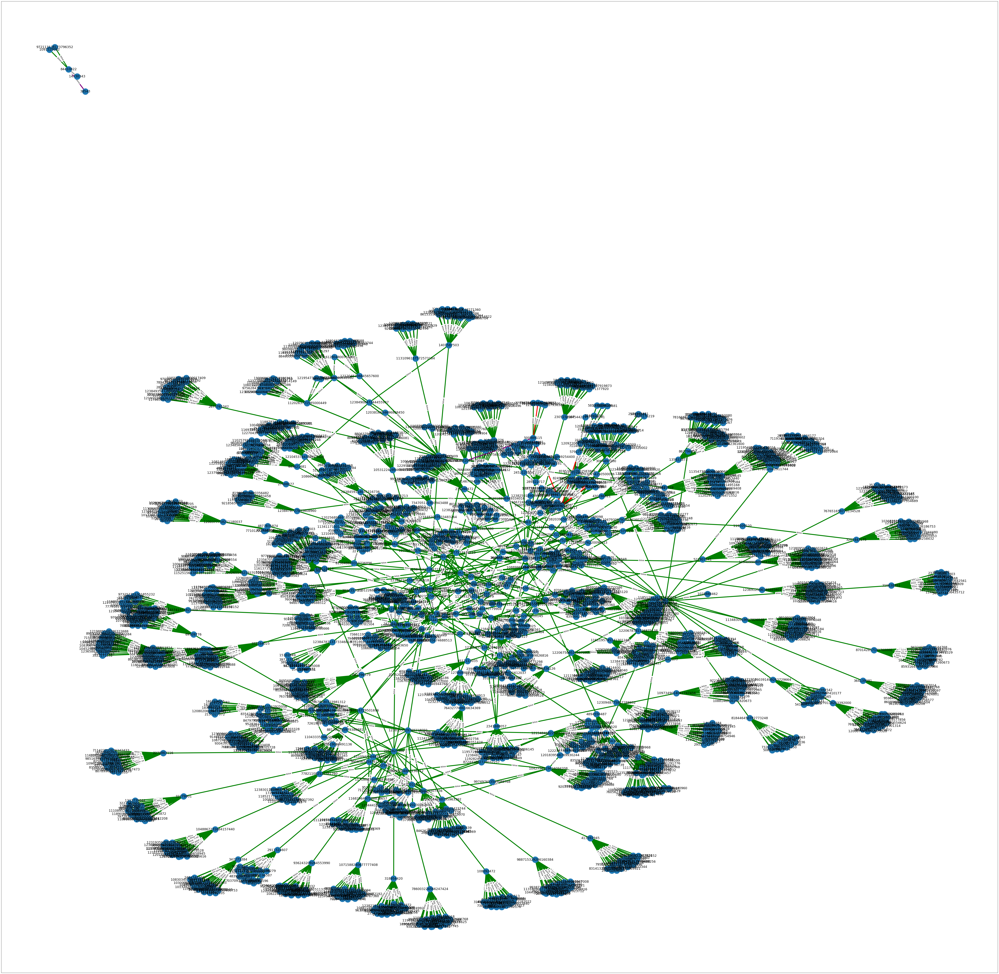

In [32]:
plt.figure(3,figsize=(100,100))

# Draw nodes
nx.draw_networkx_nodes(g,pos,node_size=1200)
 
# Draw edges
nx.draw_networkx_edges(g, pos, edgelist=edge_follow, width=5, edge_color='green')
nx.draw_networkx_edges(g, pos, edgelist=edge_converse, width=5, edge_color='purple')
nx.draw_networkx_edges(g, pos, edgelist=edge_retweet, width=5, edge_color='red')
 
# Draw node labels
nx.draw_networkx_labels(g,pos,font_size=18,font_family='sans-serif')
# Draw edge labels

edge_labels =dict([((u, v), d['label']) 
                   for u, v, d in g.edges(data=True)])
 
nx.draw_networkx_edge_labels(g, pos, edge_labels=edge_labels)

plt.show() # display